In [4]:
from IPython.display import HTML
#HTML(addToggle())

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

In [5]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 400
from __future__ import division
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
import time
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr"


In [8]:
X_train_new = np.load('/Users/JakeCanfield/Desktop/Krishnan_Research_Group/data/Summer_2018/20180801/tissues_only_tSNE_X_train_new_3.npy')
X_data = np.load('/Users/JakeCanfield/Desktop/Krishnan_Research_Group/data/gene_data_and_current_running_scripts/X_2017-12-06.npy')
X_train = X_data[0:81206,:]
X_train_new = X_train_new[:,0:3]
X_train_new = pd.DataFrame(X_train_new)
#print(np.shape(X_train_new))
#columns = ['x','y','z'] + list(range(3,994,1))
columns= ['x','y','z']


# load the annotated arrays
fp = '/Users/JakeCanfield/Desktop/Krishnan_Research_Group/data/Summer_2018/20180723/'
cols = ['GSE','GSM','Disease?','Tissue']
train_data = np.load(fp+'GSE_GSM_key_train_labelled.npy')
columns = columns + cols
# make the data frames
df = pd.DataFrame(data=train_data,columns=cols)

# 2D Plots of the First 3 Principal Components Colored by Tissue

/Users/JakeCanfield/anaconda3/lib/python3.6/site-packages/seaborn/regression.py:546: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


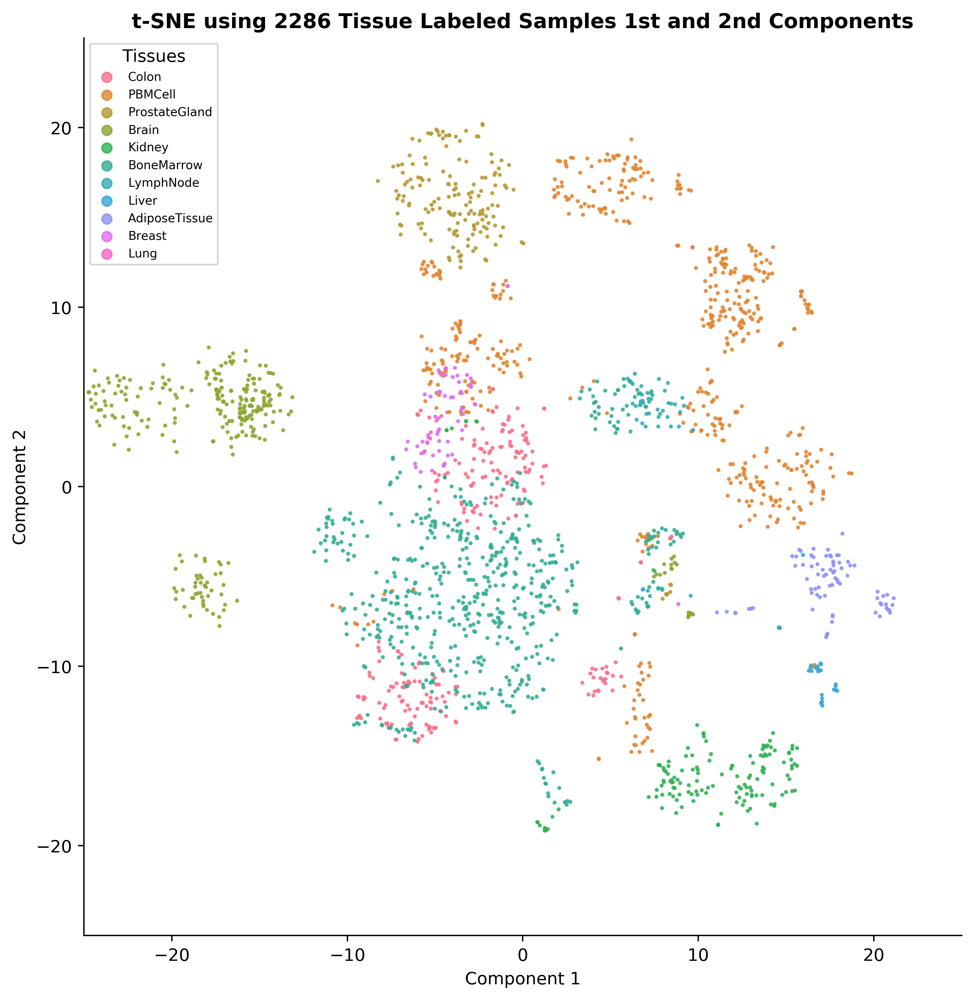

In [9]:
# tidy up the data frame
disease_dict = {'0.0': 'yes', '1': 'no'}
tissue_dict = {'0.0':'Unk/Diseased', '0001155':'Colon', '0000178':'PBMCell', '0002367':'ProstateGland', 
               '0000955':'Brain', '0002113':'Kidney', '0002371':'BoneMarrow', '0000029':'LymphNode', 
               '0002107':'Liver', '0001013':'AdiposeTissue', '0000310':'Breast', '0002048':'Lung'}
tissue_color = {'0.0':'w', '0001155':'r', '0000178':'b', '0002367':'y', 
               '0000955':'g', '0002113':'c', '0002371':'m', '0000029':'k', 
               '0002107':'purple', '0001013':'navy', '0000310':'lime', '0002048':'grey'}

df = df[(df[['Tissue']] != '0.0').all(axis=1)]
df2 = df[(df[['Tissue']] != '0.0').all(axis=1)]
df["Tissue"].replace(tissue_dict, inplace=True)
df = pd.DataFrame(np.hstack((X_train_new,df)),columns = columns)
sns.lmplot(data=df,x='x',y='y',hue='Tissue',legend=False,fit_reg=False,scatter_kws={'s':2},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(loc=2,fontsize='x-small',markerscale=4,title='Tissues')
samples = len(df['Tissue'])
plt.title('t-SNE using '+ str(samples) + ' Tissue Labeled Samples 1st and 2nd Components',weight='bold')
plt.show()
df2['color'] = df2['Tissue'].map(tissue_color)
df2['Tissue'].replace(tissue_dict, inplace=True)


/Users/JakeCanfield/anaconda3/lib/python3.6/site-packages/seaborn/regression.py:546: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


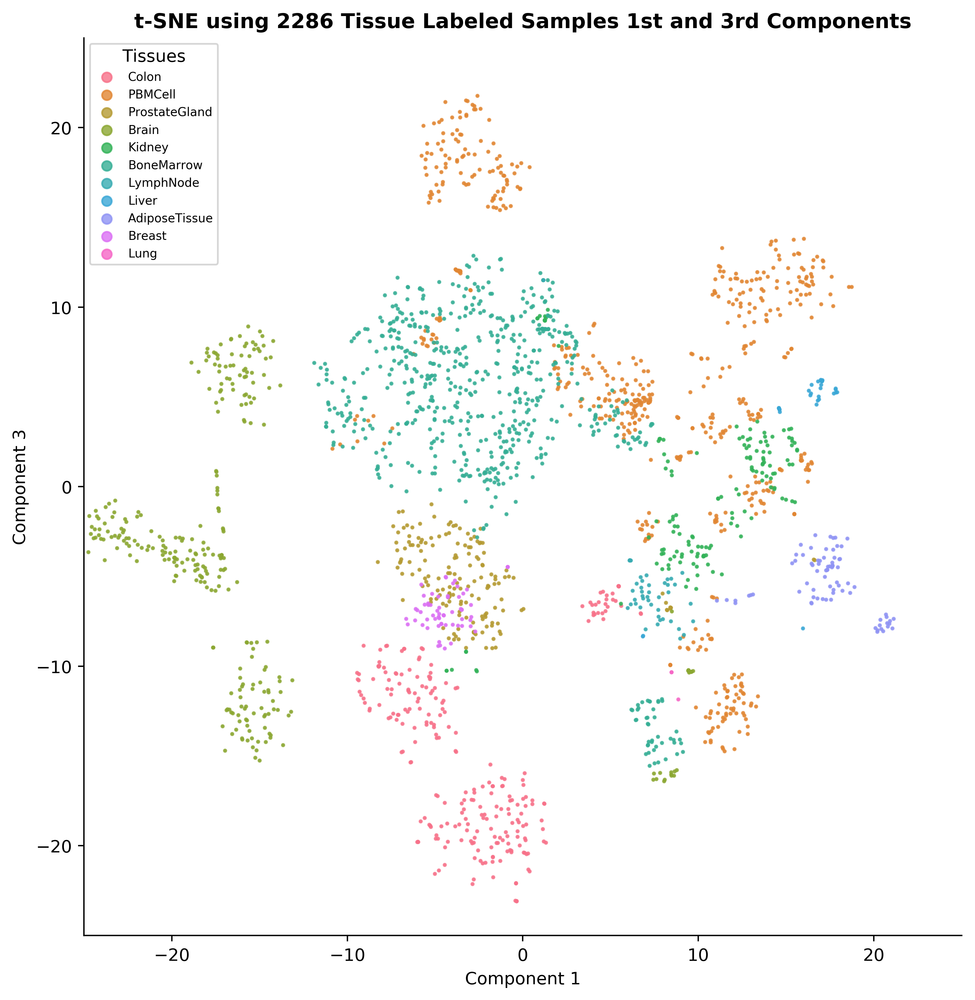

In [10]:
sns.lmplot(data=df,x='x',y='z',hue='Tissue',legend=False,fit_reg=False,scatter_kws={'s':2},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 3',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(loc=2,fontsize='x-small',markerscale=4,title='Tissues')
samples = len(df['Tissue'])
plt.title('t-SNE using '+ str(samples) + ' Tissue Labeled Samples 1st and 3rd Components',weight='bold')
plt.show()

/Users/JakeCanfield/anaconda3/lib/python3.6/site-packages/seaborn/regression.py:546: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


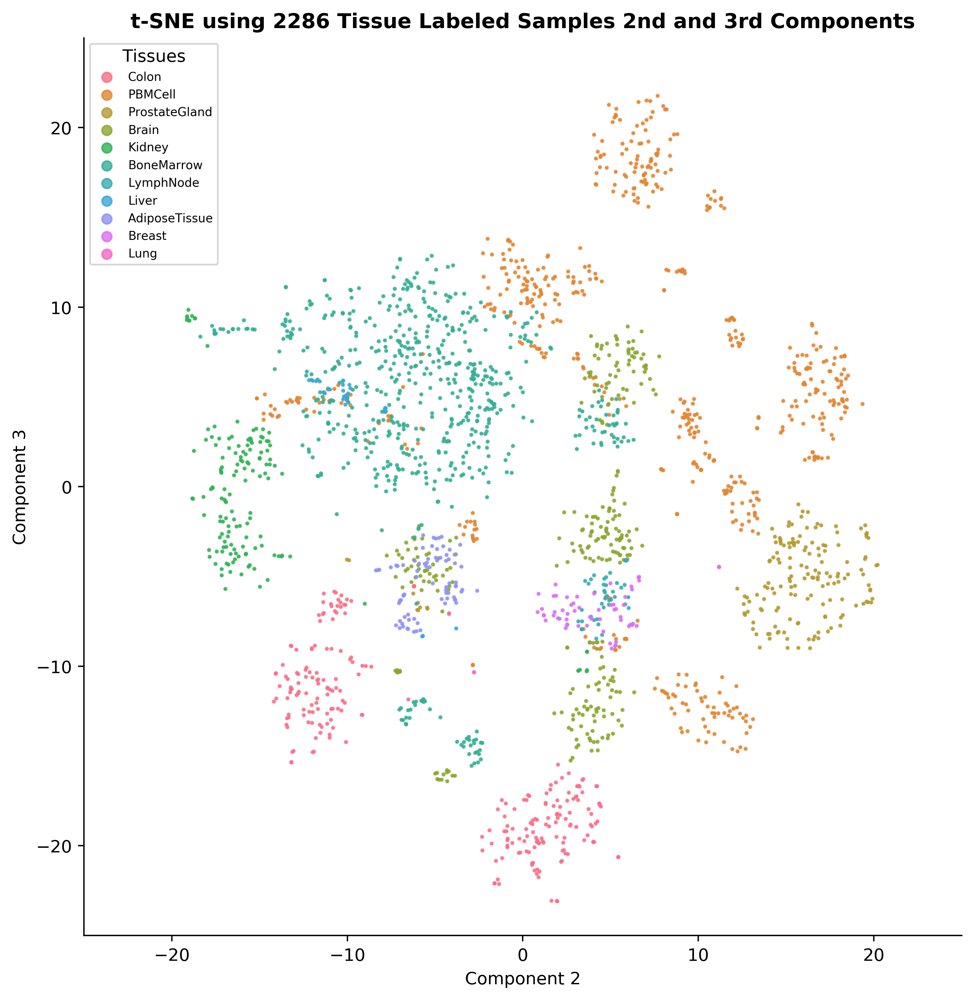

In [11]:
sns.lmplot(data=df,x='y',y='z',hue='Tissue',legend=False,fit_reg=False,scatter_kws={'s':2},size=8,aspect=1)
plt.xlabel('Component 2',size=10)
plt.ylabel('Component 3',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(loc=2,fontsize='x-small',markerscale=4,title='Tissues')
samples = len(df['Tissue'])
plt.title('t-SNE using '+ str(samples) + ' Tissue Labeled Samples 2nd and 3rd Components',weight='bold')
plt.show()

# Table Sampling Data and Showing Color Legend

In [19]:
from IPython.display import display
Tissues = df2.Tissue.unique()
colors_ = df2.color.unique()
GSM_counts = []
for tissue in Tissues:
    df_tissue = df2.loc[df2['Tissue'] == '%s'%tissue]
    counts = len(df_tissue['GSE'])
    GSM_counts.append(counts)
GSE_counts = []
for tissue in Tissues:
    df_tissue = df2.loc[df2['Tissue'] == '%s'%tissue]
    counts = len(np.unique(df_tissue['GSE']))
    GSE_counts.append(counts)
df3 = np.transpose(np.vstack((Tissues,GSE_counts,GSM_counts)))
df3 = pd.DataFrame(df3,columns=['Tissues','Number of Unique GSE\'s','Number of GSM\'s'])
display(df2.sample(frac=1).head(),df3.head(n=12).sort_values('Number of GSM\'s',ascending=False))

,GSE,GSM,Disease?,Tissue,color
76305,GSE35935,GSM877739,1,PBMCell,b
45821,GSE53987,GSM1304866,1,Brain,g
17145,GSE71935,GSM1847556,1,BoneMarrow,m
75045,GSE46699,GSM1134818,1,Kidney,c
27190,GSE71226,GSM1830987,1,PBMCell,b


,Tissues,Number of Unique GSE's,Number of GSM's
5,BoneMarrow,5,619
1,PBMCell,20,593
3,Brain,8,294
0,Colon,4,252
2,ProstateGland,3,164
4,Kidney,3,147
8,AdiposeTissue,2,77
9,Breast,3,61
6,LymphNode,4,45
7,Liver,4,31


# Plots of the First 2 Principal Components Colored by GSE (Subset of GSEs)

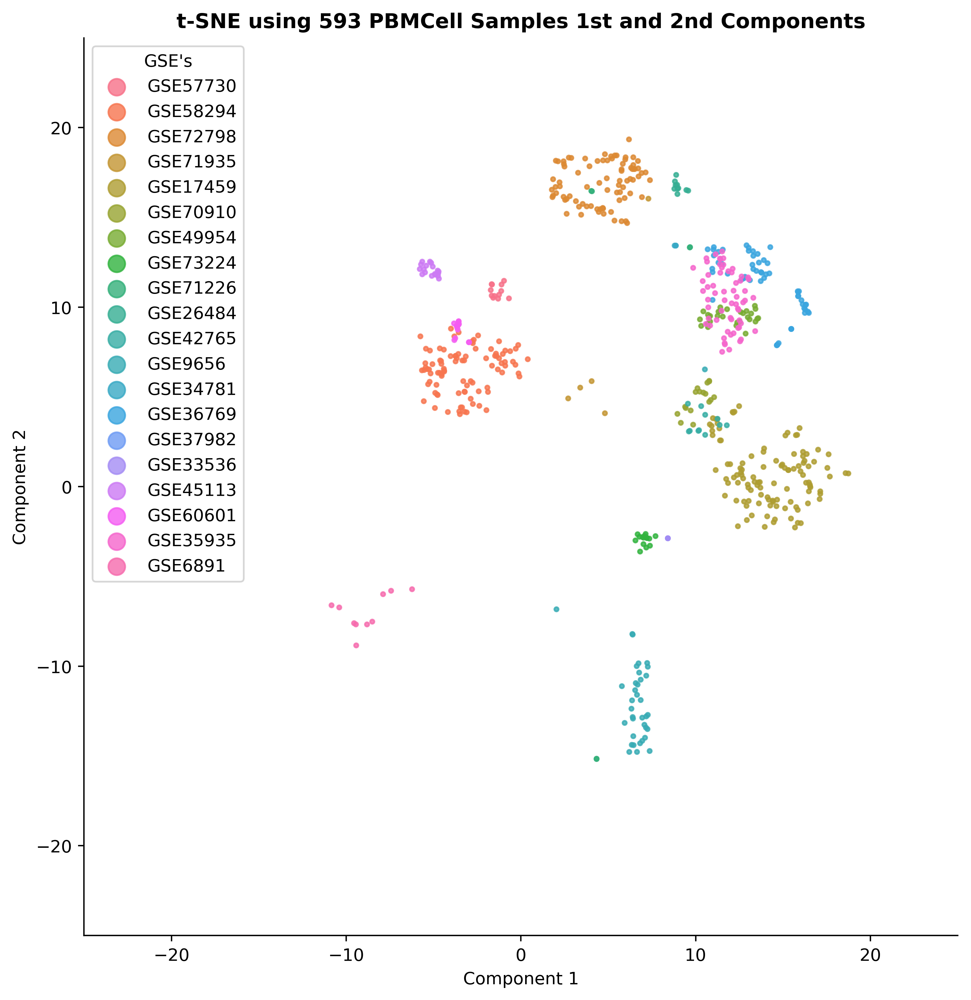

In [100]:
GSEs = df.loc[df['Tissue'] == 'PBMCell']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' PBMCell Samples 1st and 2nd Components',weight='bold')
plt.show()

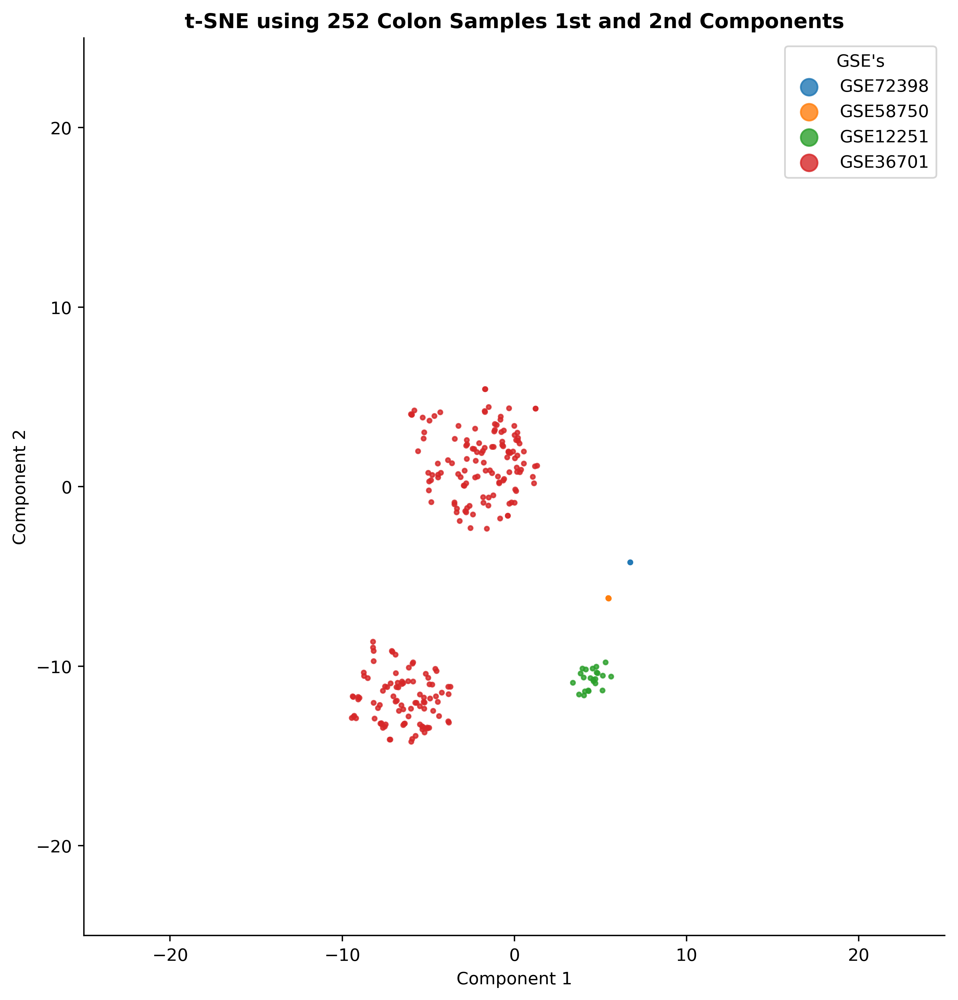

In [101]:
GSEs = df.loc[df['Tissue'] == 'Colon']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' Colon Samples 1st and 2nd Components',weight='bold')
plt.show()

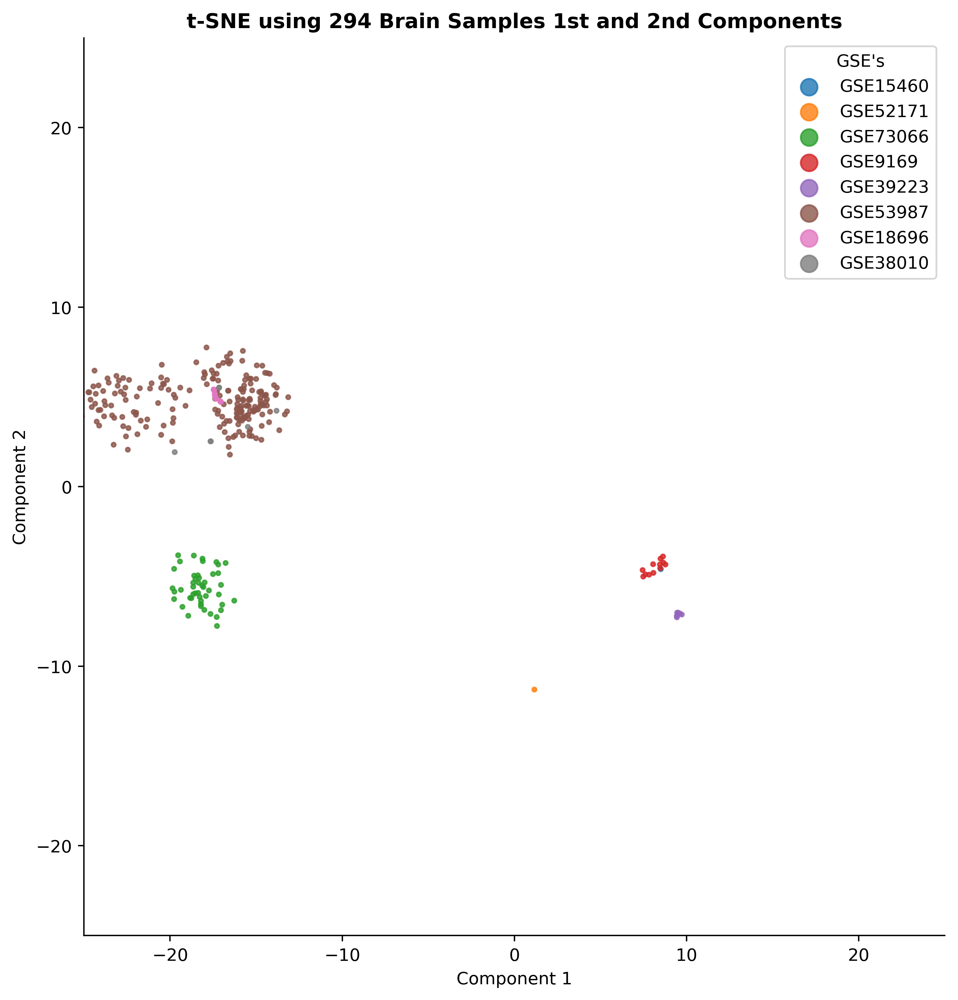

In [102]:
GSEs = df.loc[df['Tissue'] == 'Brain']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' Brain Samples 1st and 2nd Components',weight='bold')
plt.show()

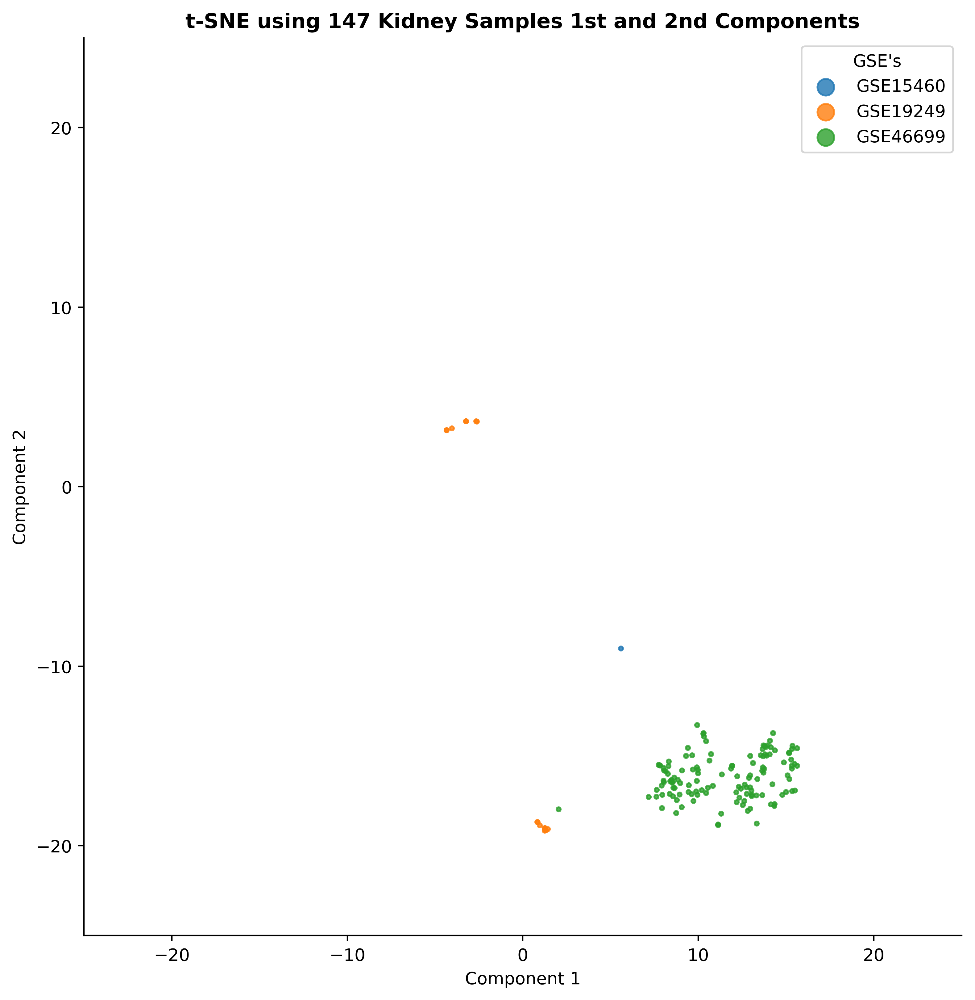

In [103]:
GSEs = df.loc[df['Tissue'] == 'Kidney']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' Kidney Samples 1st and 2nd Components',weight='bold')
plt.show()

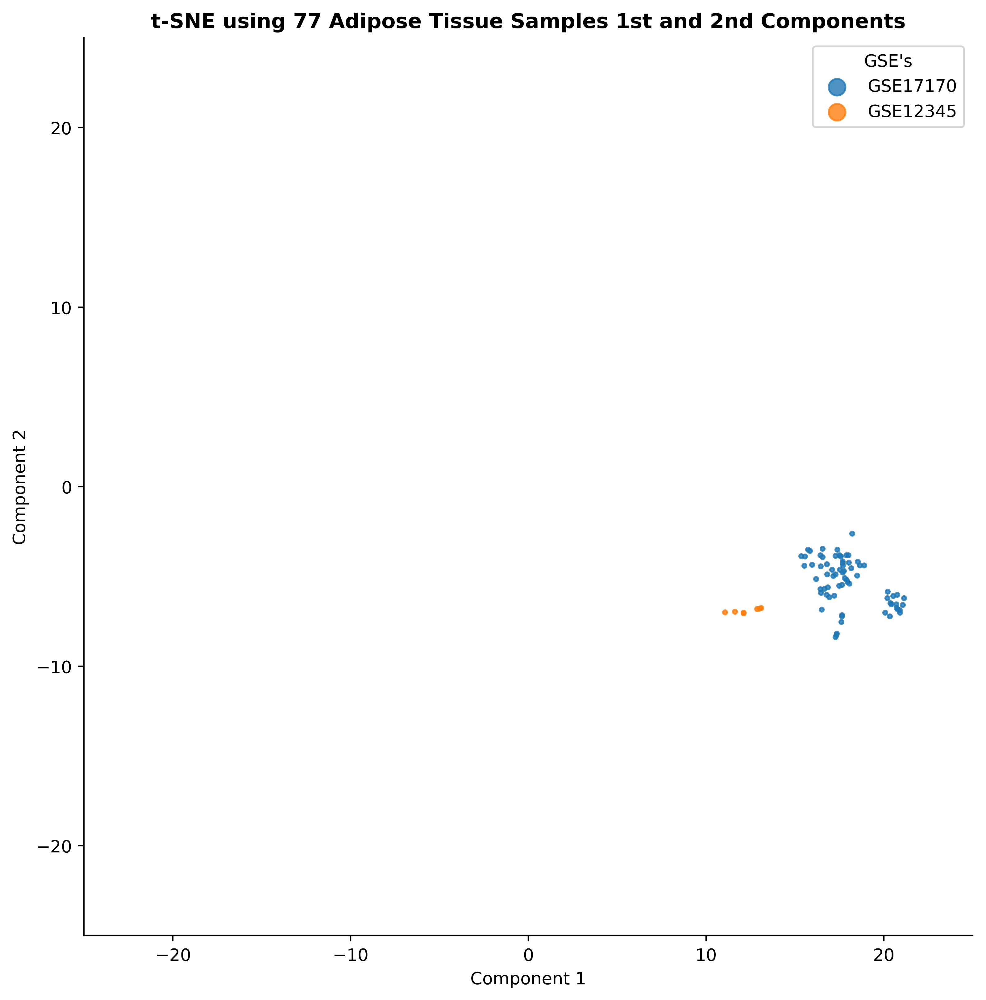

In [108]:
GSEs = df.loc[df['Tissue'] == 'AdiposeTissue']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' Adipose Tissue Samples 1st and 2nd Components',weight='bold')
plt.show()

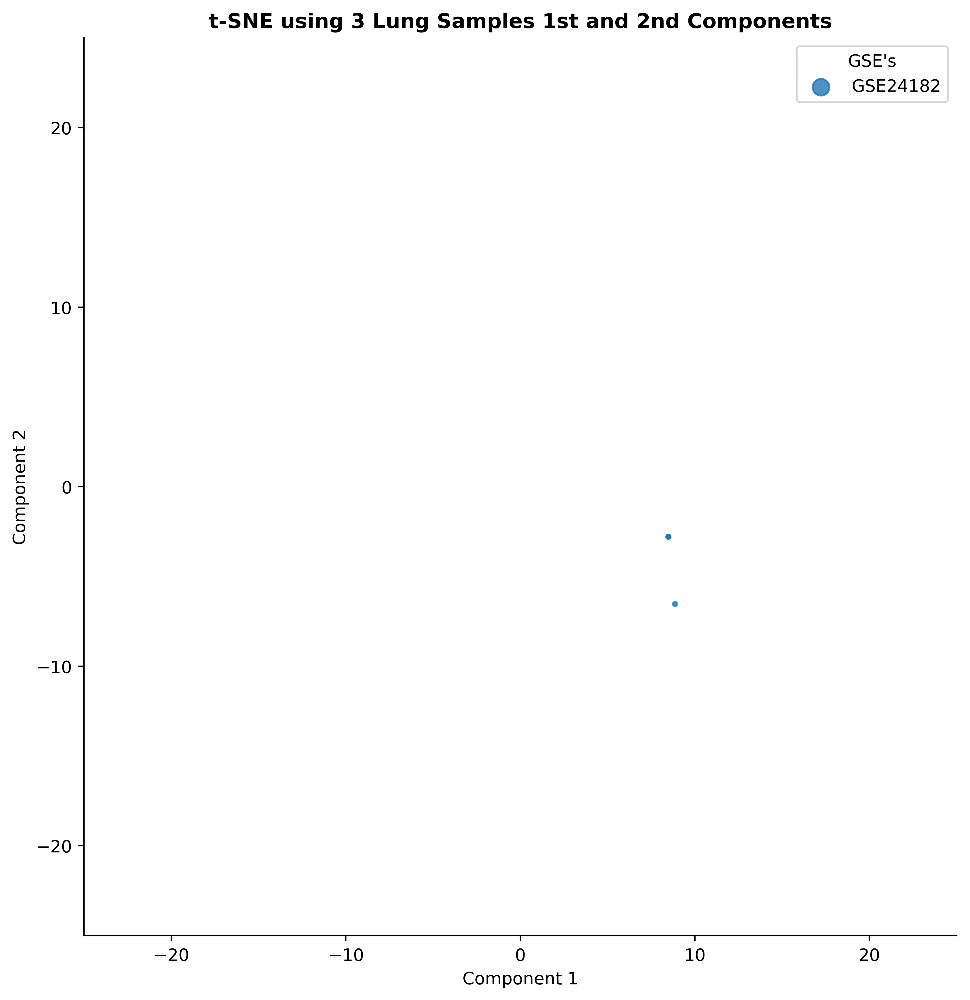

In [105]:
GSEs = df.loc[df['Tissue'] == 'Lung']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' Lung Samples 1st and 2nd Components',weight='bold')
plt.show()

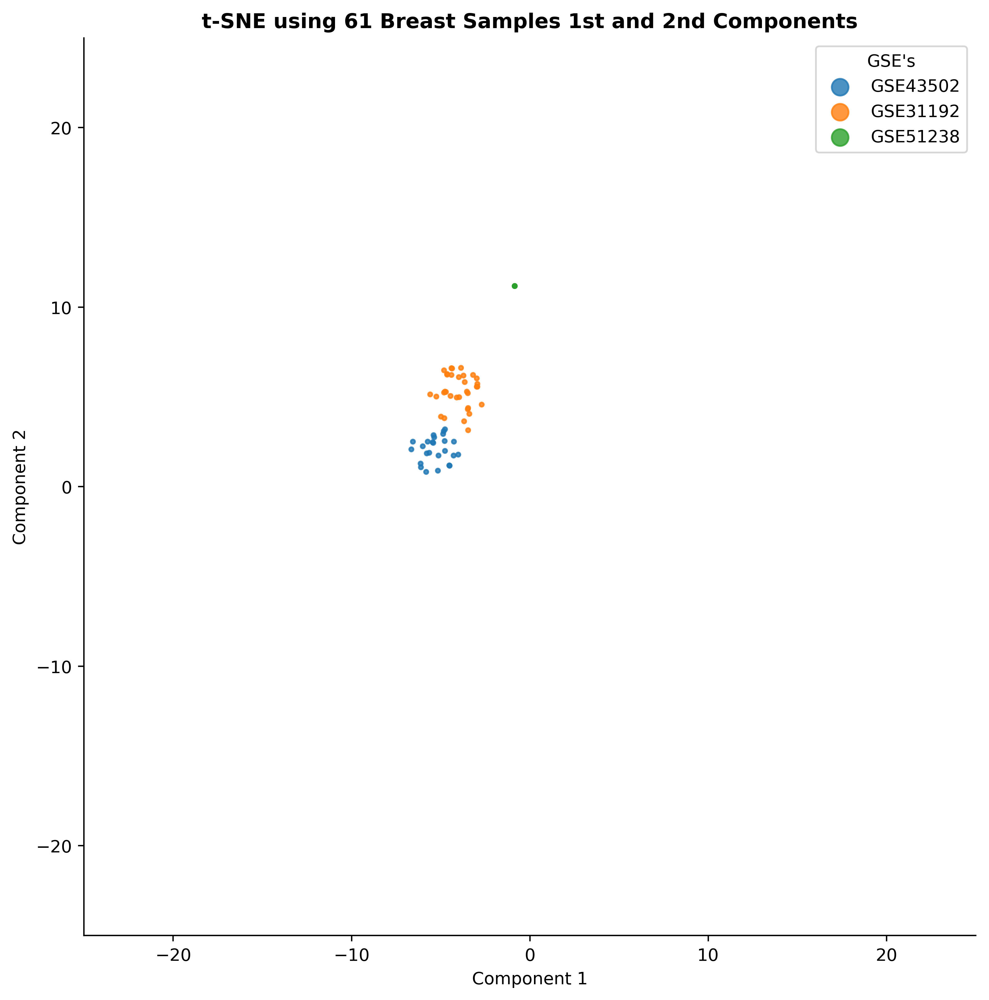

In [106]:
GSEs = df.loc[df['Tissue'] == 'Breast']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' Breast Samples 1st and 2nd Components',weight='bold')
plt.show()

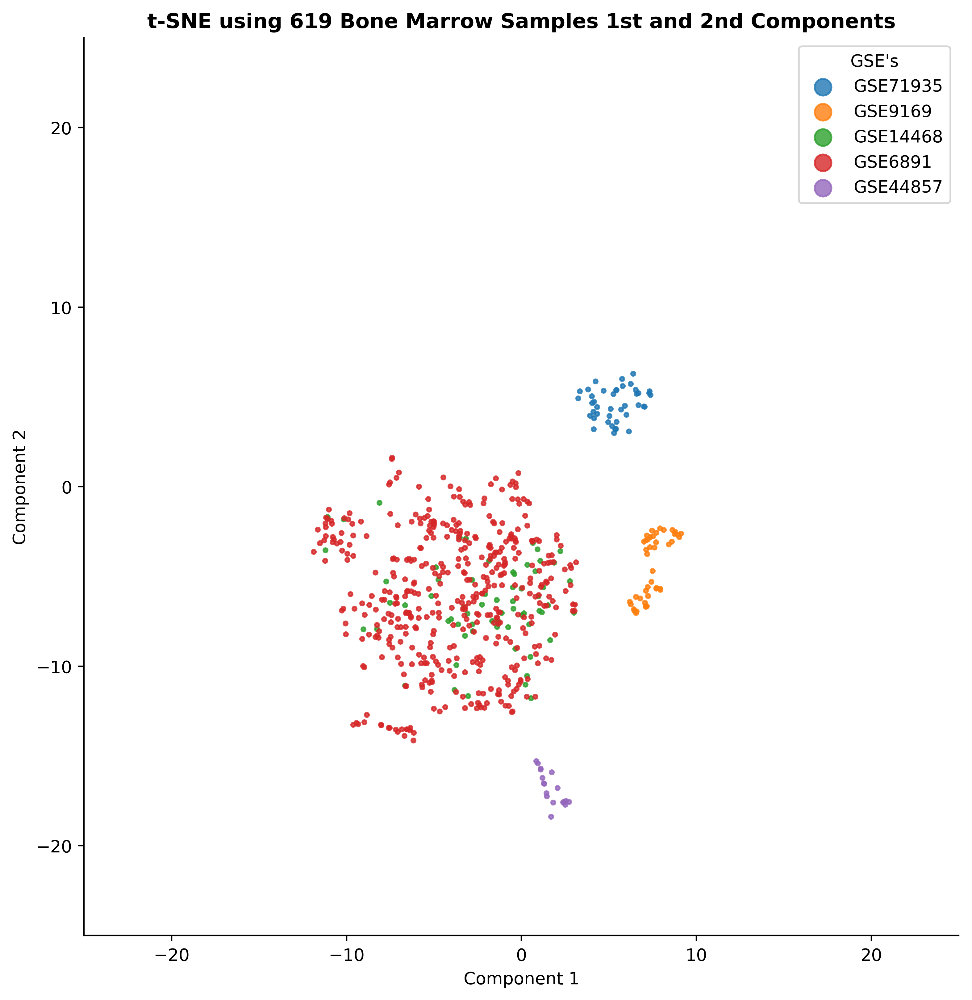

In [107]:
GSEs = df.loc[df['Tissue'] == 'BoneMarrow']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' Bone Marrow Samples 1st and 2nd Components',weight='bold')
plt.show()

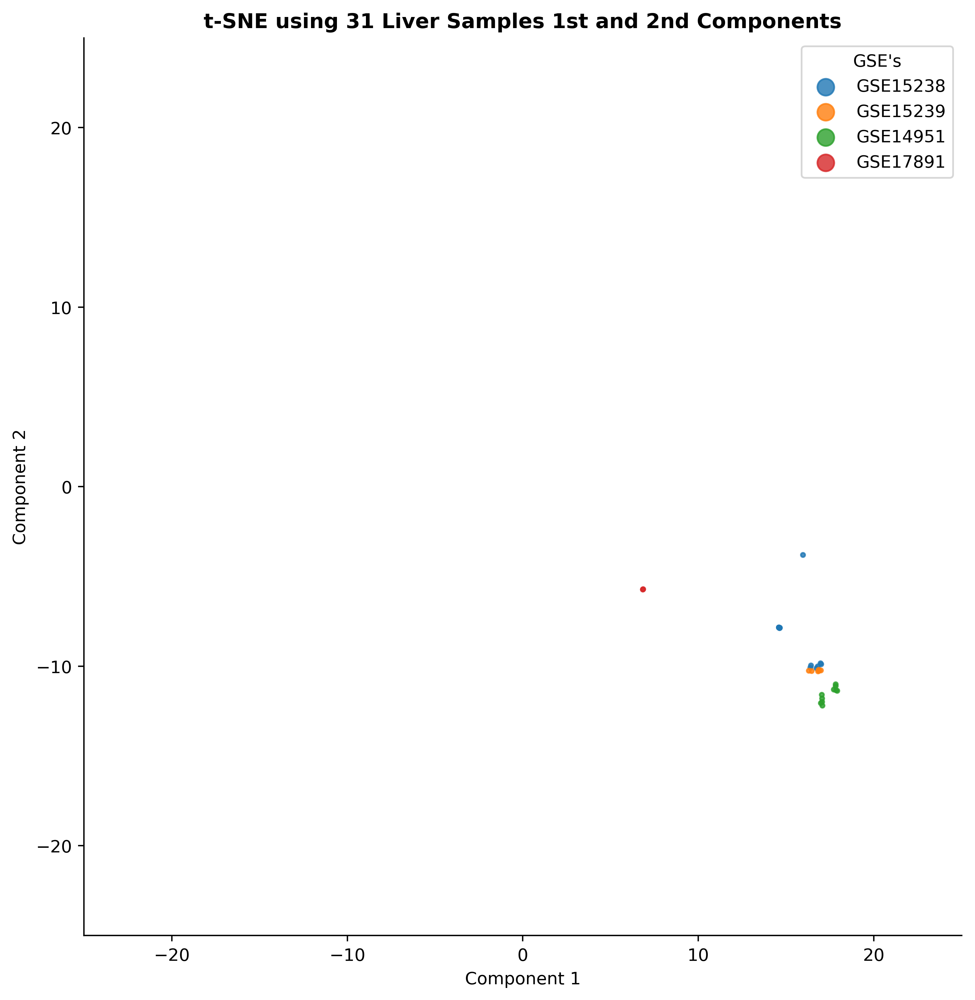

In [109]:
GSEs = df.loc[df['Tissue'] == 'Liver']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' Liver Samples 1st and 2nd Components',weight='bold')
plt.show()

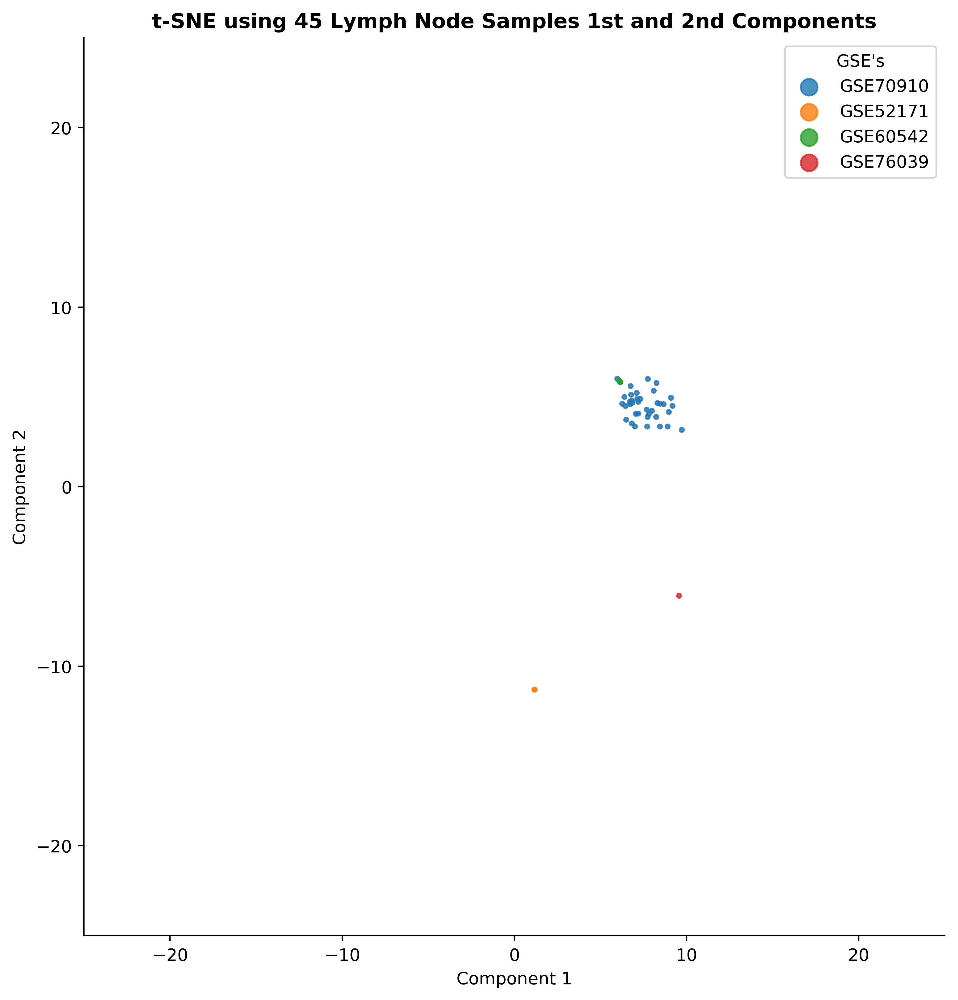

In [110]:
GSEs = df.loc[df['Tissue'] == 'LymphNode']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' Lymph Node Samples 1st and 2nd Components',weight='bold')
plt.show()

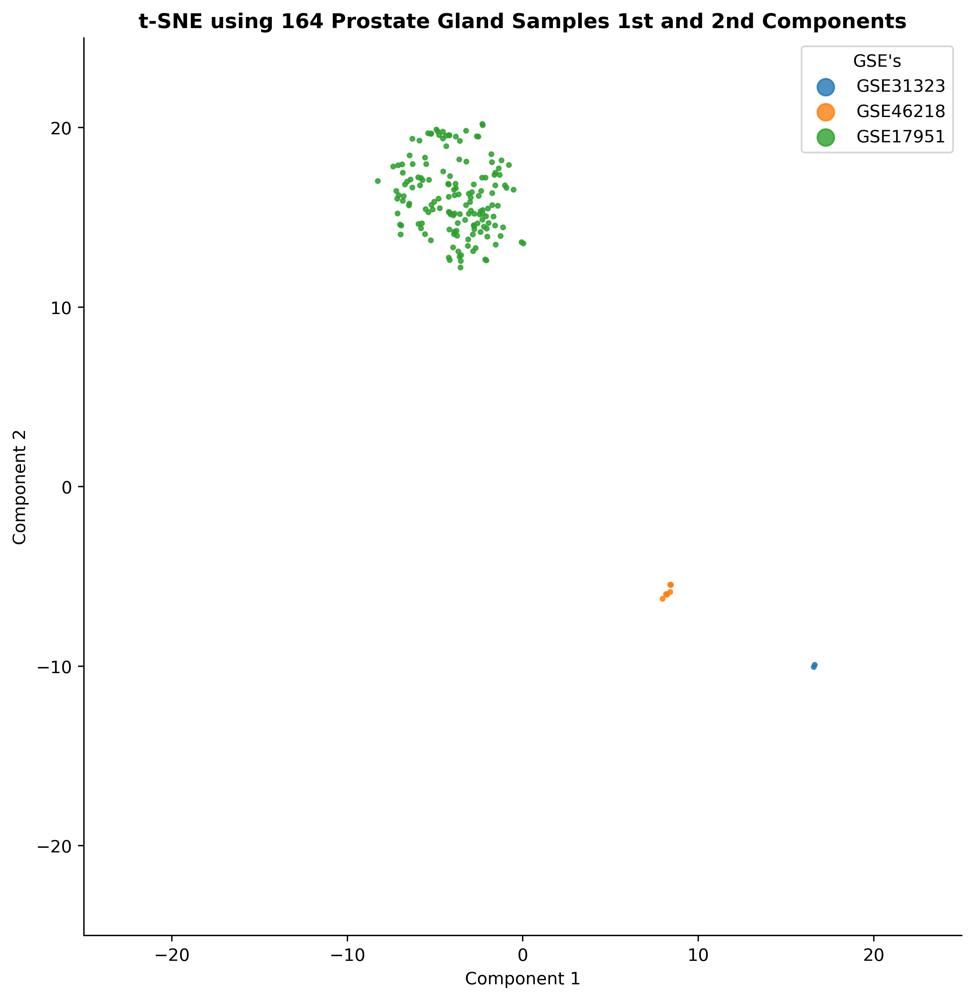

In [111]:
GSEs = df.loc[df['Tissue'] == 'ProstateGland']
sns.lmplot(data=GSEs,x='x',y='y',hue='GSE',legend=False,fit_reg=False,scatter_kws={'s':6},size=8,aspect=1)
plt.xlabel('Component 1',size=10)
plt.ylabel('Component 2',size=10)
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlim(xmin=-25,xmax=25)
plt.ylim(ymin=-25,ymax=25)
plt.legend(markerscale=4,title='GSE\'s')
samples = len(GSEs['GSM'])
plt.title('t-SNE using '+ str(samples) + ' Prostate Gland Samples 1st and 2nd Components',weight='bold')
plt.show()

# 3D Plots of the First 3 Principal Components from Different Views

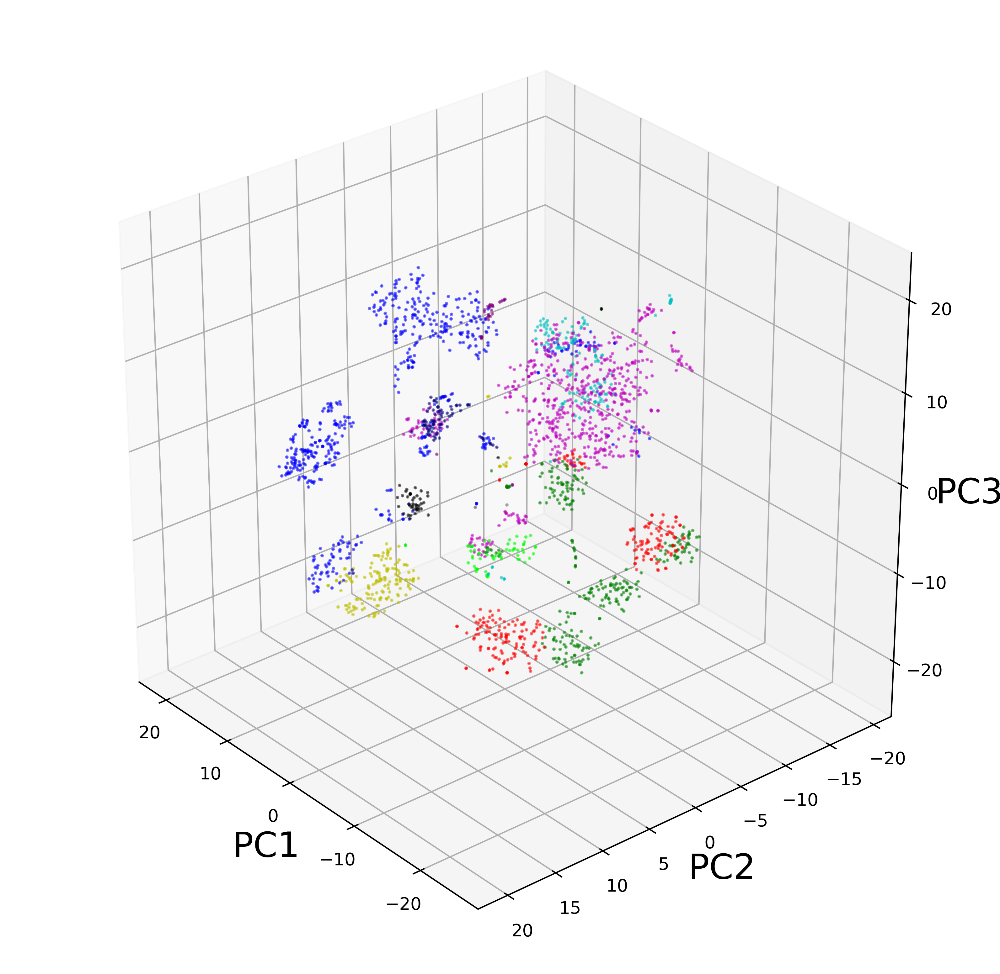

In [79]:

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['x'], df['y'], df['z'],c=df2['color'],alpha=0.5,depthshade=True,s=1)
#ax.set_xlim(100,-100)
#ax.set_ylim(100,-100)
#ax.set_zlim(100,-100)

ax.set_xlabel("PC1",size=20)
ax.set_ylabel("PC2",size=20)
ax.set_zlabel("PC3",size=20)
ax.view_init(30,140)
plt.show()


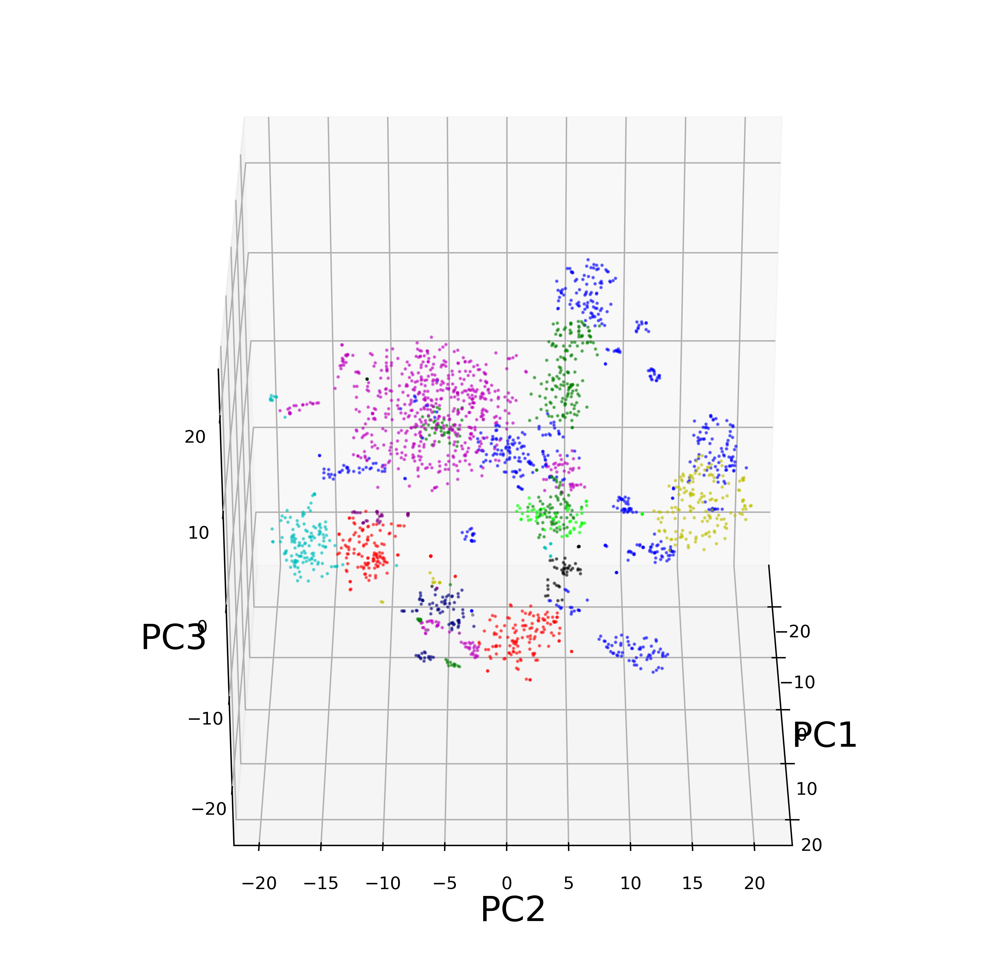

In [80]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['x'], df['y'], df['z'],c=df2['color'],alpha=0.5,depthshade=True,s=1)
#ax.set_xlim(100,-100)
#ax.set_ylim(100,-100)
#ax.set_zlim(100,-100)

ax.set_xlabel("PC1",size=20)
ax.set_ylabel("PC2",size=20)
ax.set_zlabel("PC3",size=20)
ax.view_init(30,0)
plt.show()

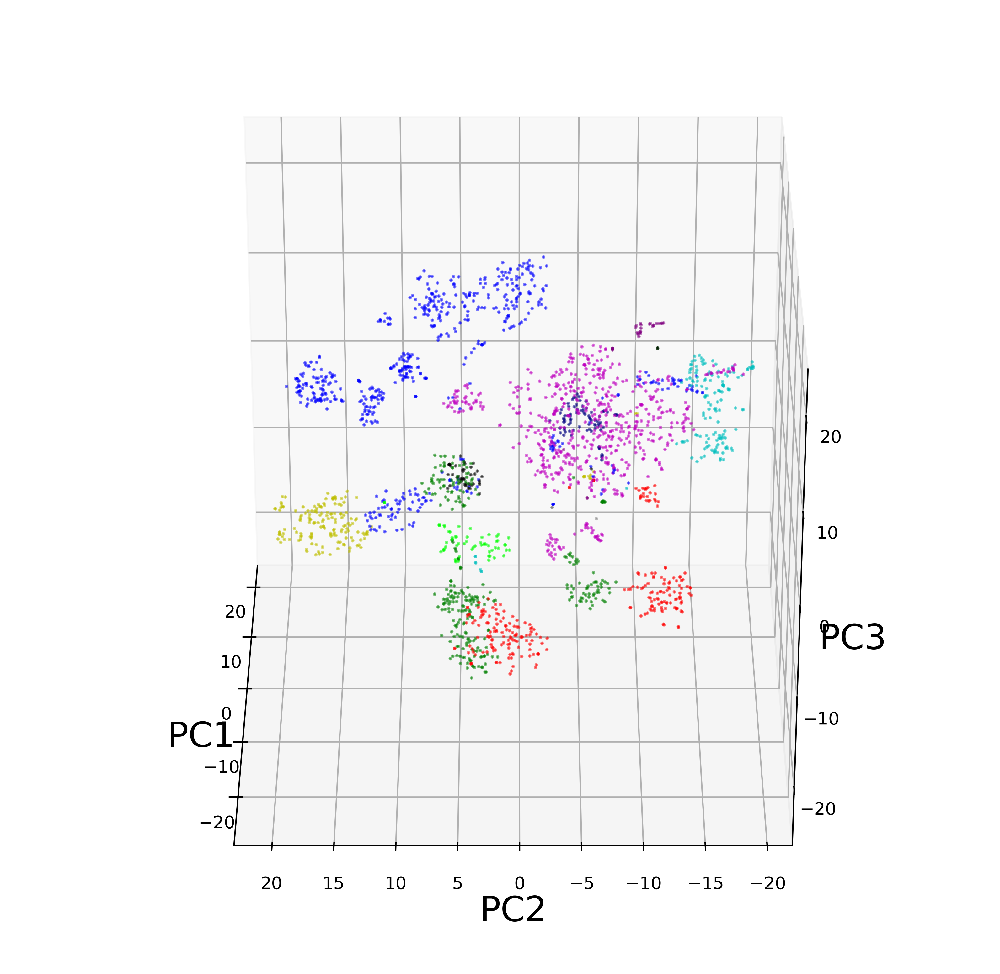

In [81]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['x'], df['y'], df['z'],c=df2['color'],alpha=0.5,depthshade=True,s=1)
#ax.set_xlim(100,-100)
#ax.set_ylim(100,-100)
#ax.set_zlim(100,-100)

ax.set_xlabel("PC1",size=20)
ax.set_ylabel("PC2",size=20)
ax.set_zlabel("PC3",size=20)
ax.view_init(30,180)
plt.show()

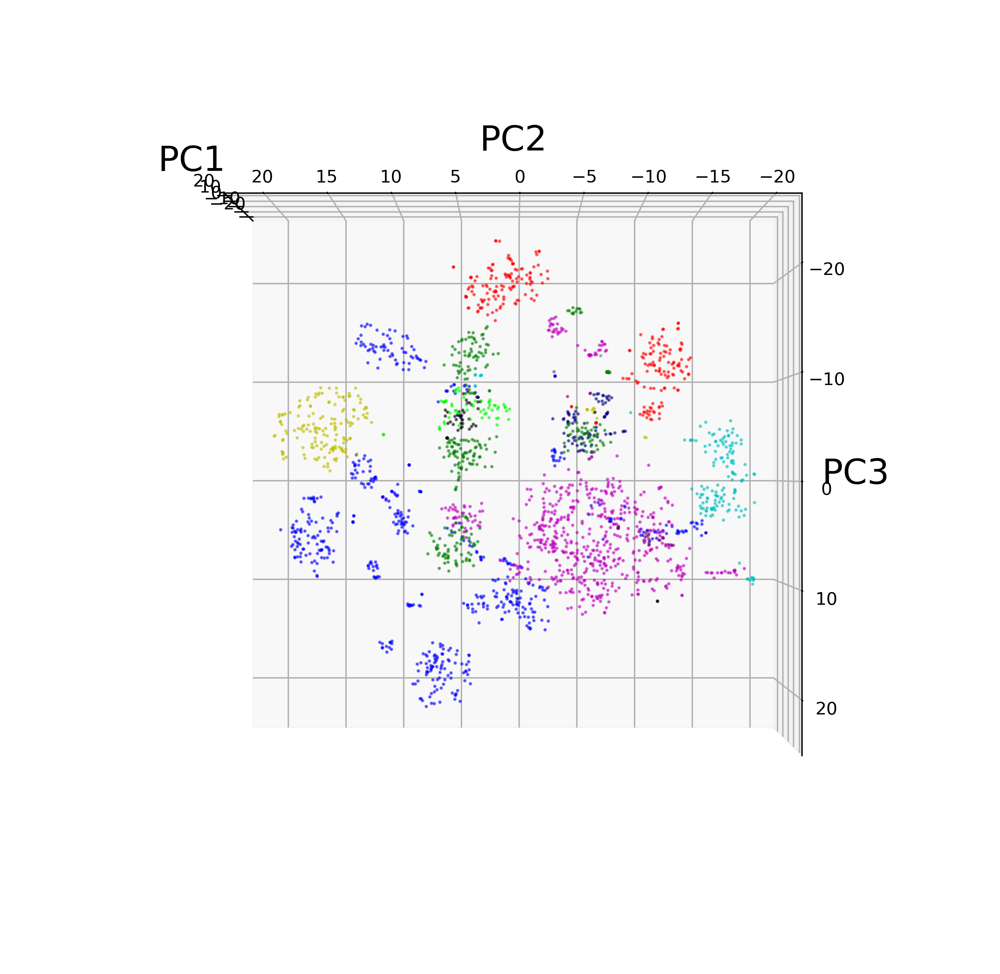

In [82]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['x'], df['y'], df['z'],c=df2['color'],alpha=0.5,depthshade=True,s=1)
#ax.set_xlim(100,-100)
#ax.set_ylim(100,-100)
#ax.set_zlim(100,-100)

ax.set_xlabel("PC1",size=20)
ax.set_ylabel("PC2",size=20)
ax.set_zlabel("PC3",size=20)
ax.view_init(180,180)
plt.show()